In [2]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [3]:
adata = sc.read_h5ad('../data/mtDNA_DSB_5k_clustered.h5ad')

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


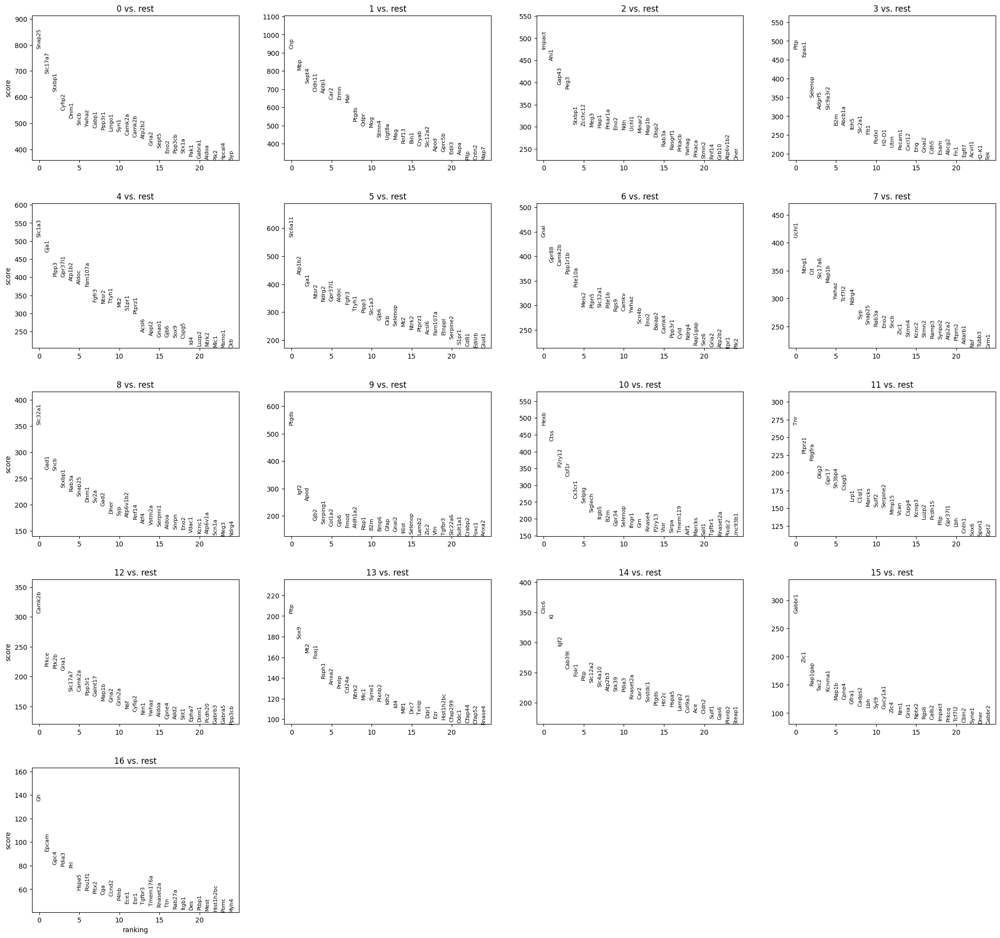

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,Snap25,785.268433,1.856531,0.0,0.0
1,0,Slc17a7,689.995544,2.968932,0.0,0.0
2,0,Stxbp1,621.430359,1.576034,0.0,0.0
3,0,Cyfip2,548.413818,1.434940,0.0,0.0
4,0,Dnm1,521.912964,1.486076,0.0,0.0


In [4]:
# --- Find marker genes per cluster ---
sc.tl.rank_genes_groups(adata, groupby="leiden_0.5", method="t-test")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

# get a tidy table of top markers
markers = sc.get.rank_genes_groups_df(adata, group=None)
markers.head()

In [28]:
marker_genes = pd.DataFrame({
    group: adata.uns['rank_genes_groups']['names'][group][:5]
    for group in adata.uns['rank_genes_groups']['names'].dtype.names
})


In [8]:
from mllmcelltype import annotate_clusters, setup_logging

In [9]:
from dotenv import load_dotenv
import os

load_dotenv()  # will read .env into environment
api_key = os.getenv("../OPENAI_API_KEY")

In [10]:
marker_genes = marker_genes.T

In [11]:
marker_genes = marker_genes.reset_index().rename(columns={'index':'cluster'})

In [12]:
marker_genes = marker_genes.set_index("cluster").T.to_dict("list")

In [13]:
import os

# Annotate clusters with a single model
annotations = annotate_clusters(
    marker_genes=marker_genes,  # DataFrame or dictionary of marker genes
    species='mouse',               # Organism species
    provider='openai',            # LLM provider
    model='gpt-4o-mini',               # Specific model
    tissue='brain'                #Tissue context (optional but recommended)
)

# Print annotations
for cluster, annotation in annotations.items():
    print(f"Cluster {cluster}: {annotation}")

2025-09-23 14:01:17 - llmcelltype - INFO - Logging initialized. Log file: /Users/christoffer/.llmcelltype/logs/llmcelltype_20250923_140117.log
2025-09-23 14:01:17 - llmcelltype - INFO - Starting annotation with provider: openai
2025-09-23 14:01:17 - llmcelltype - INFO - Found 17 clusters
2025-09-23 14:01:17 - llmcelltype - INFO - Creating prompt for 17 clusters
2025-09-23 14:01:17 - llmcelltype - INFO - Generated prompt with 1400 characters
2025-09-23 14:01:17 - llmcelltype - INFO - Processing request with openai using model gpt-4o-mini
2025-09-23 14:01:17 - llmcelltype - INFO - Starting OpenAI API request with model: gpt-4o-mini
2025-09-23 14:01:17 - llmcelltype - INFO - Using model: gpt-4o-mini
2025-09-23 14:01:17 - llmcelltype - INFO - Processing 1 chunks of input
2025-09-23 14:01:17 - llmcelltype - INFO - Processing chunk 1 of 1
2025-09-23 14:01:17 - llmcelltype - INFO - Sending API request...
2025-09-23 14:01:22 - llmcelltype - INFO - Got response with 17 lines
2025-09-23 14:01:22

Cluster 0: Excitatory Neurons
Cluster 1: Oligodendrocytes
Cluster 2: Neuronal Progenitors
Cluster 3: Endothelial Cells
Cluster 4: Astrocytes
Cluster 5: Astrocytes
Cluster 6: Medium Spiny Neurons
Cluster 7: Inhibitory Neurons
Cluster 8: Inhibitory Neurons
Cluster 9: Microglia
Cluster 10: Microglia
Cluster 11: Oligodendrocyte Progenitor Cells
Cluster 12: Excitatory Neurons
Cluster 13: Ependymal Cells
Cluster 14: Endothelial Cells
Cluster 15: Interneurons
Cluster 16: Neuroendocrine Cells


In [15]:
adata.obs['cell_class'] = adata.obs['leiden_0.5'].map(annotations)

... storing 'cell_class' as categorical
/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


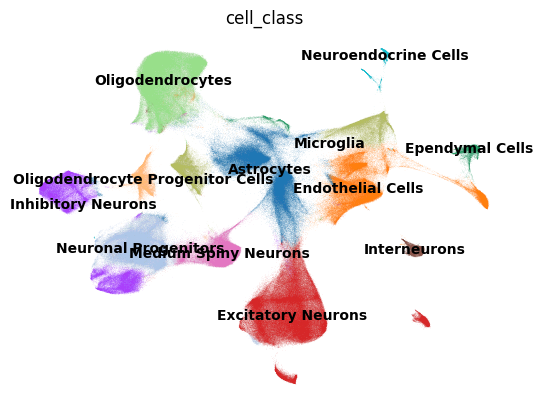

In [17]:
sc.pl.umap(adata, color='cell_class', legend_loc='on data', frameon=False)

In [26]:
spatial = np.array(adata.obs[['x_centroid','y_centroid']])
adata.obsm['spatial'] = spatial

output-XETG00045__0060539__RB4282__20250917__105852


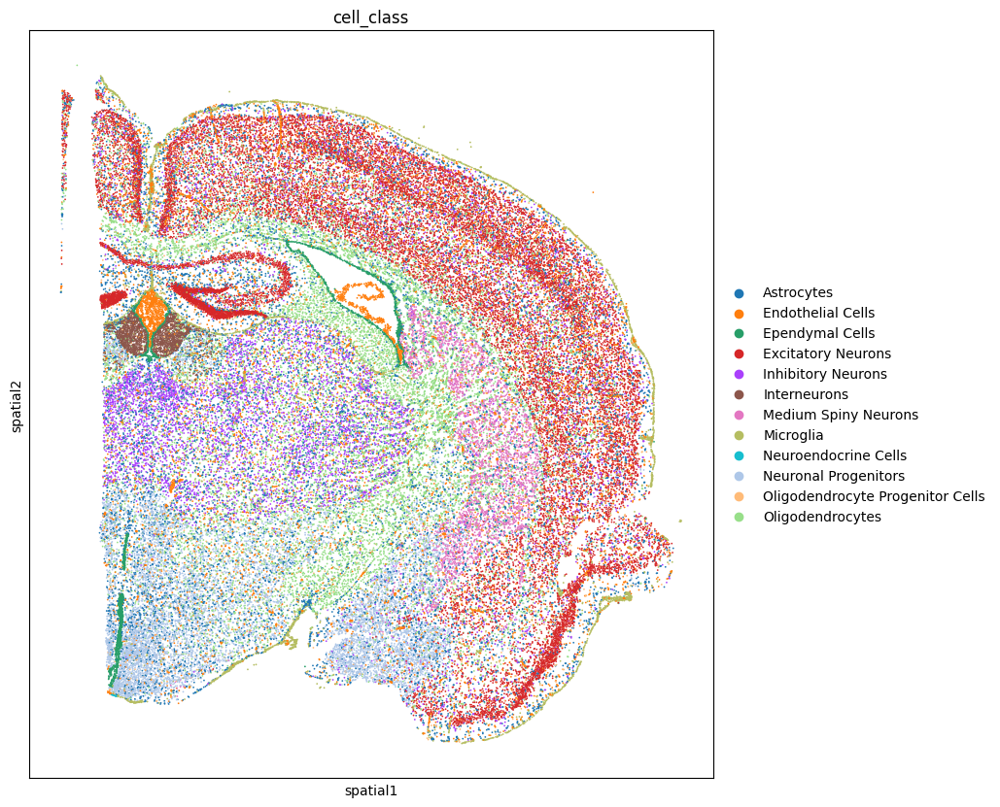

output-XETG00045__0060539__RB4350__20250917__105852


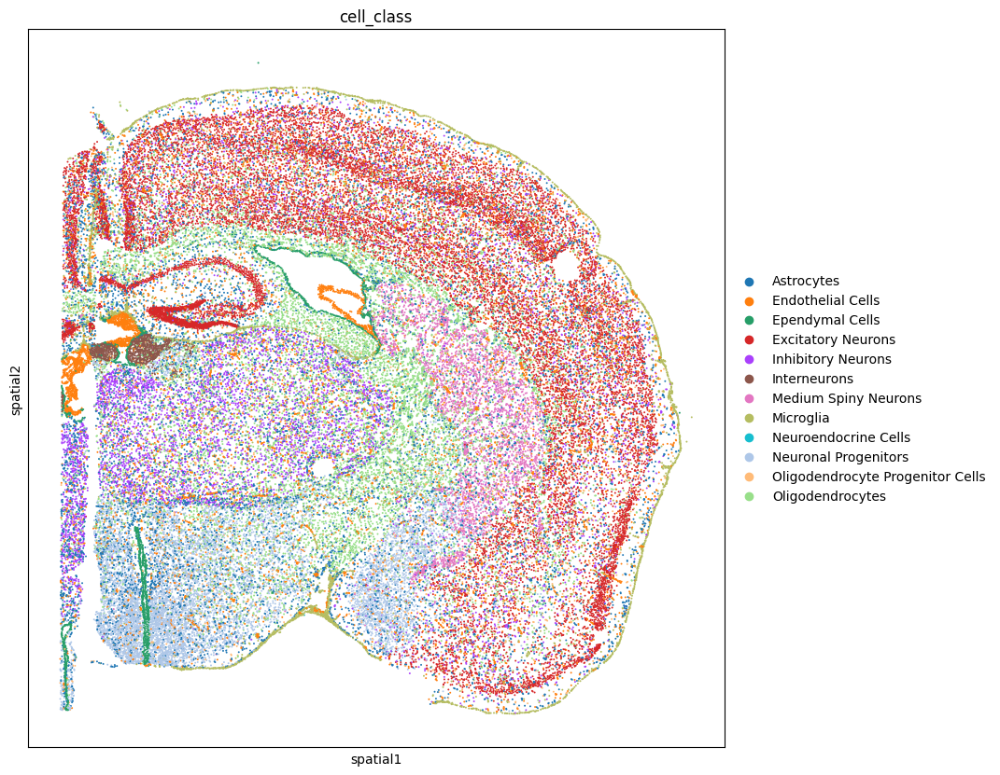

output-XETG00045__0060539__RB4401__20250917__105852


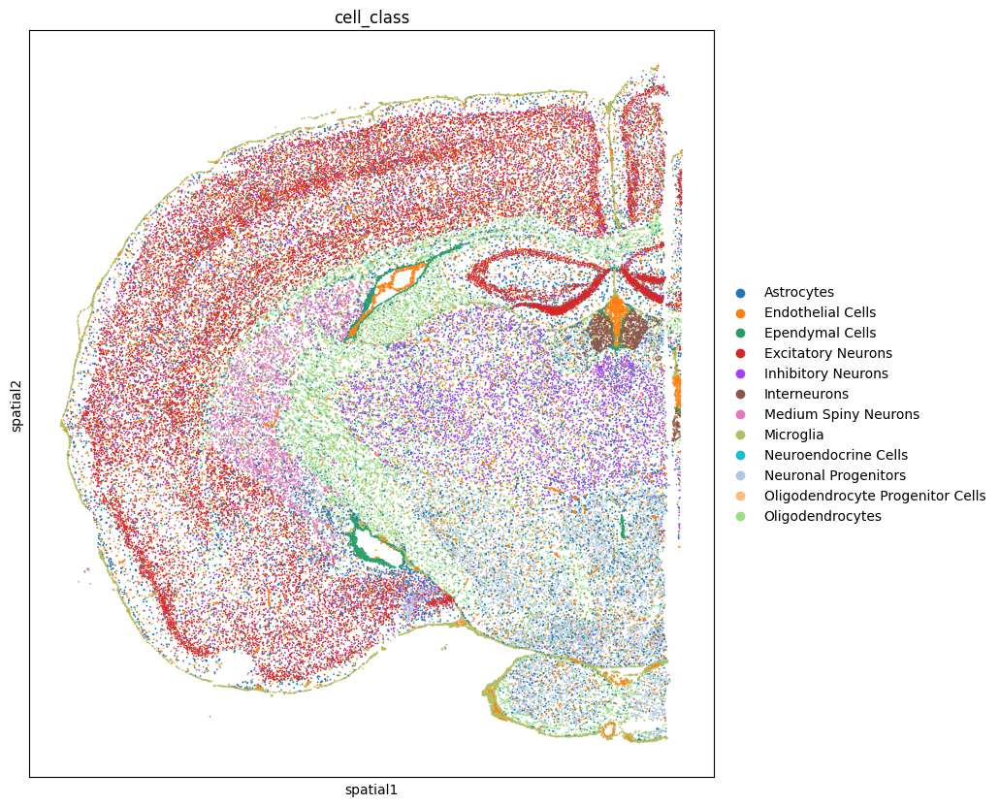

output-XETG00045__0060539__RB4403__20250917__105852


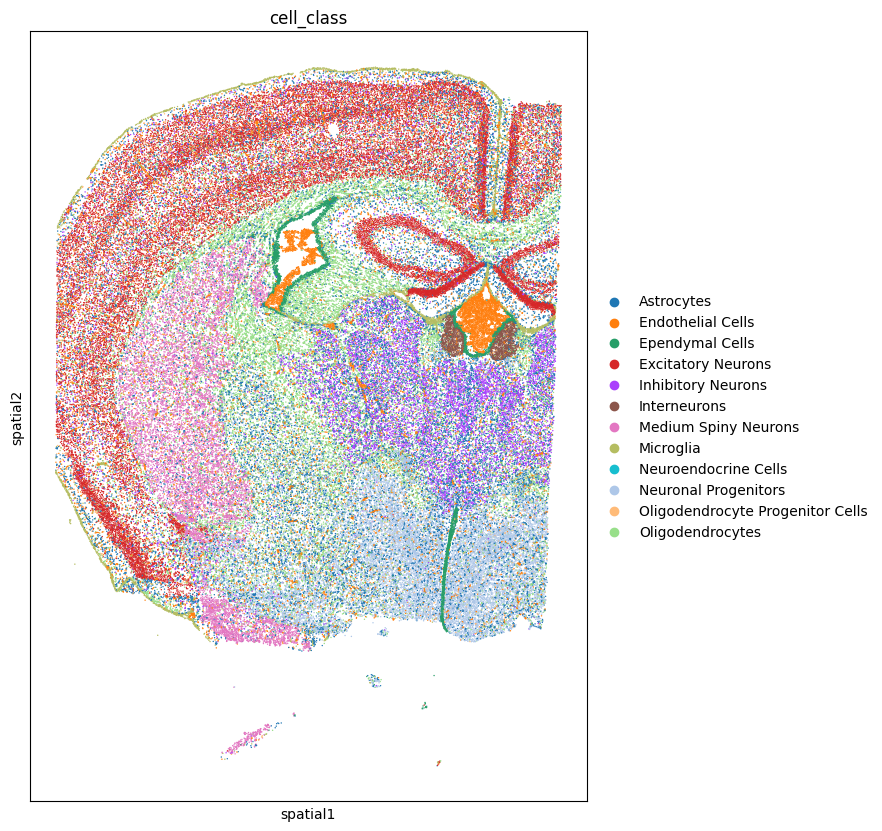

output-XETG00045__0060539__RB4405__20250917__105852


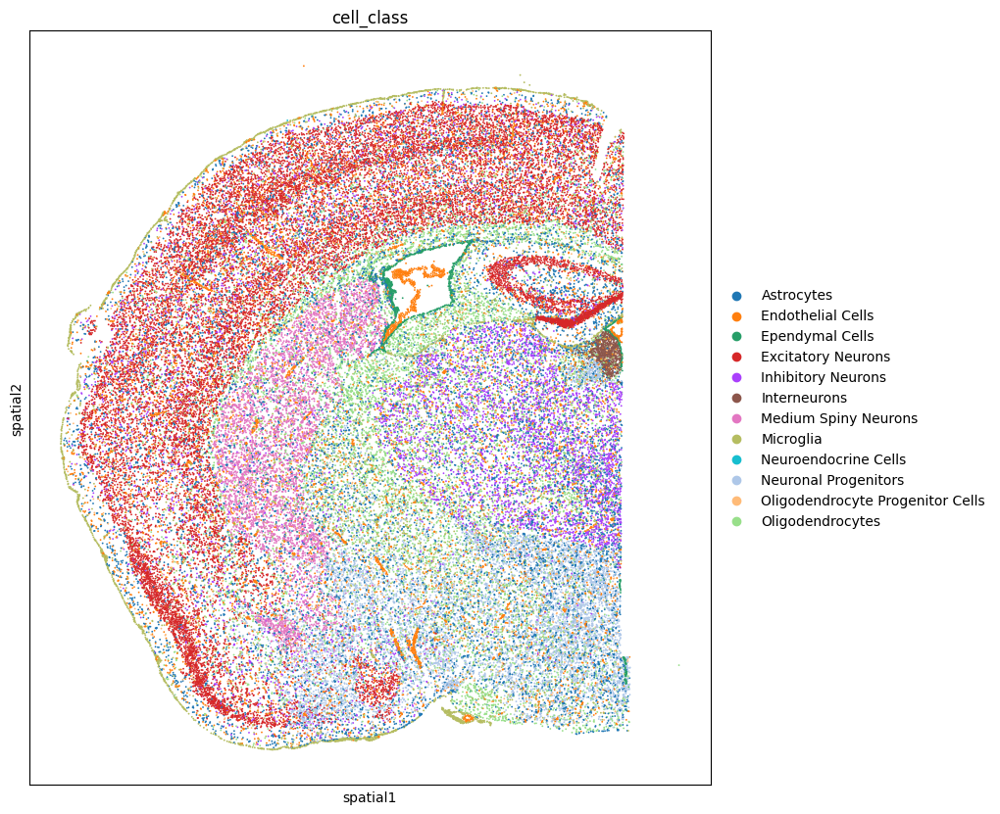

output-XETG00045__0060539__RB4498__20250917__105852


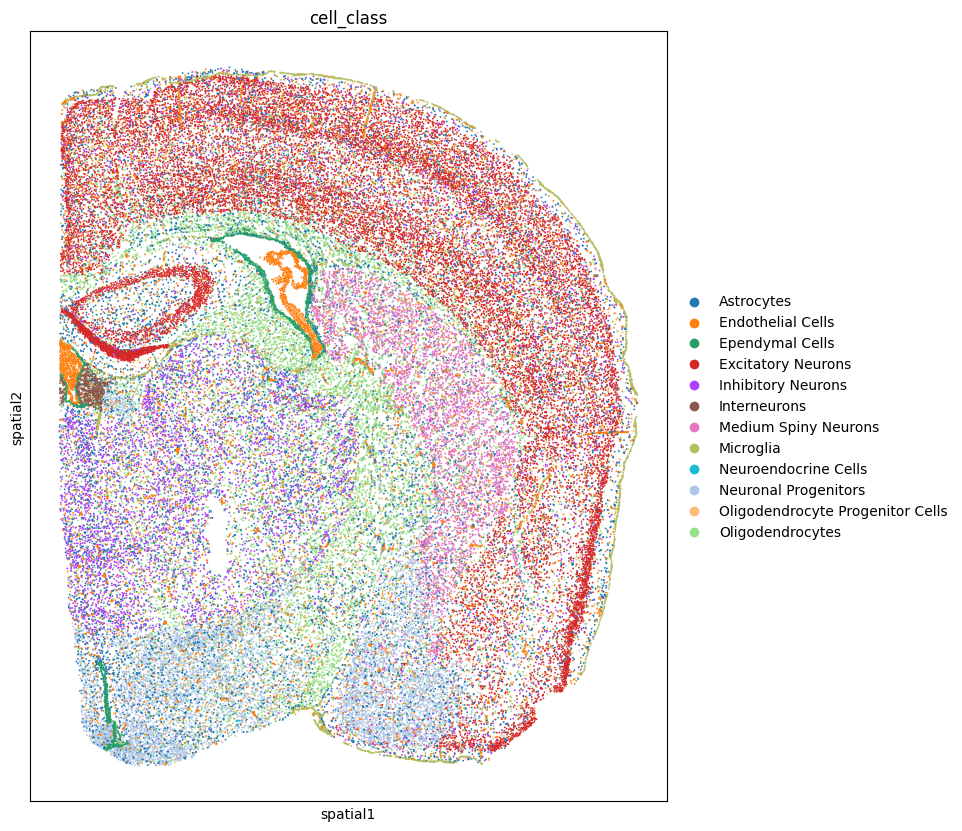

output-XETG00045__0060541__RB4620__20250917__105852


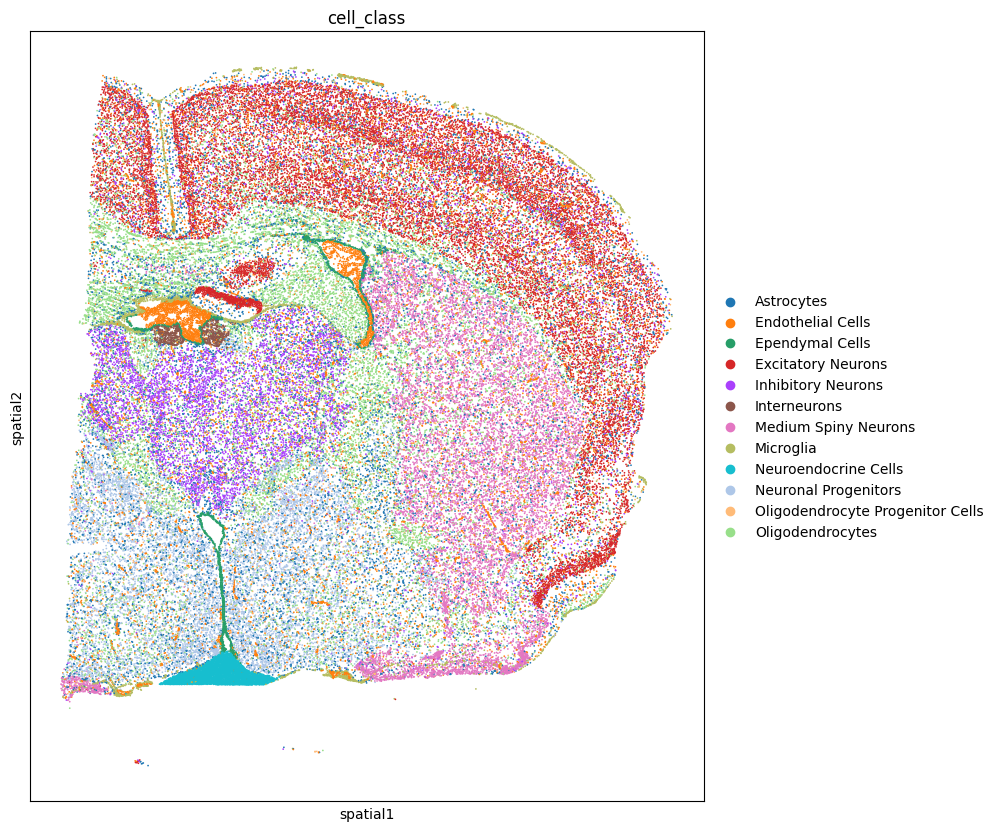

output-XETG00045__0060541__RB4627__20250917__105852


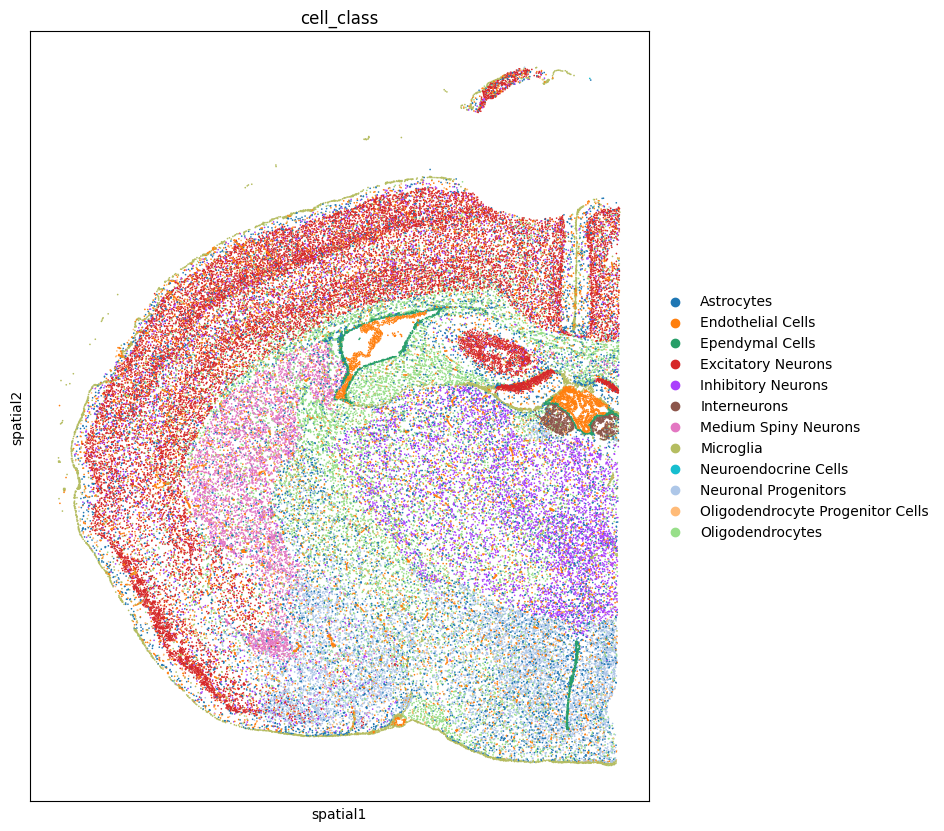

output-XETG00045__0060541__RB4630__20250917__105852


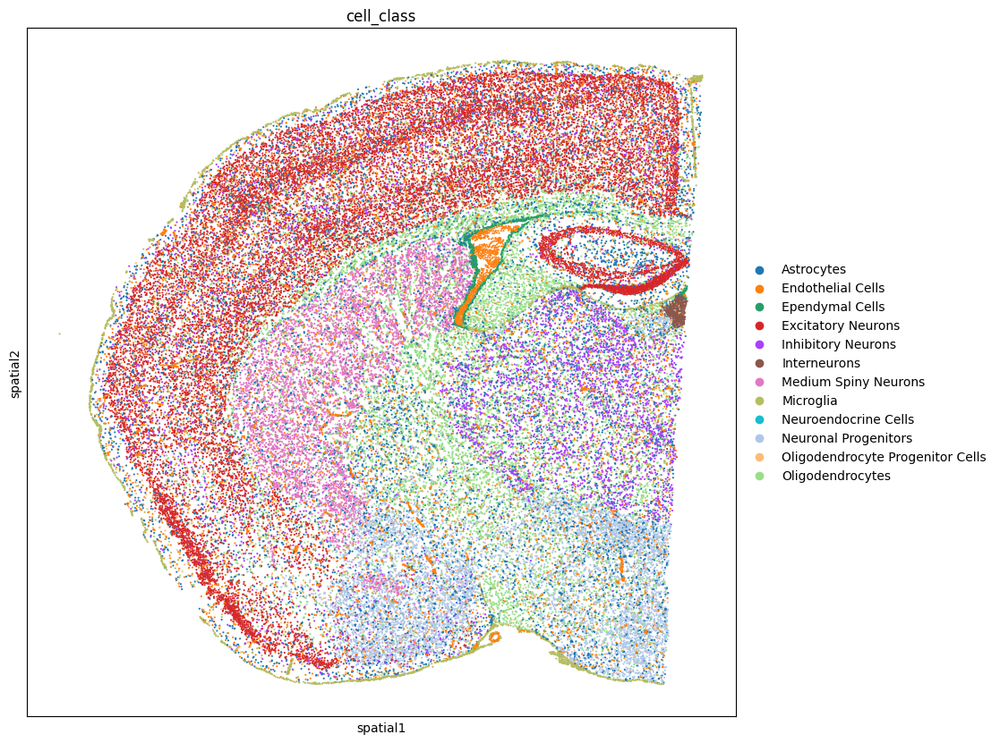

output-XETG00045__0060541__RB4653__20250917__105852


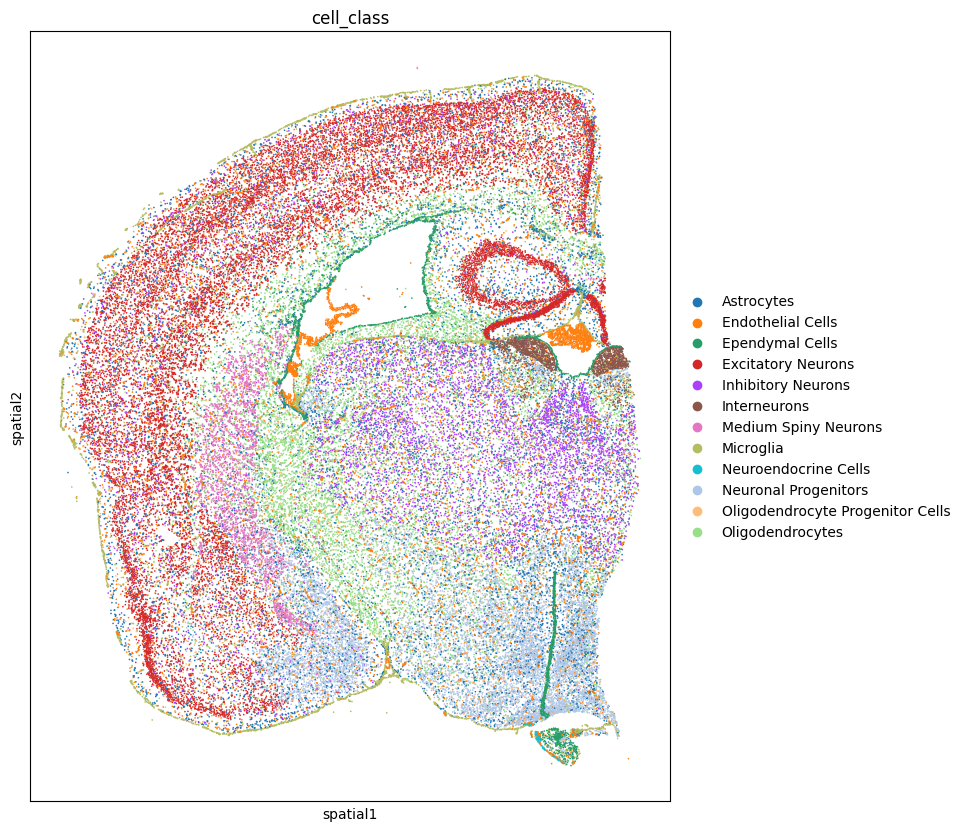

output-XETG00045__0060541__RB4658__20250917__105852


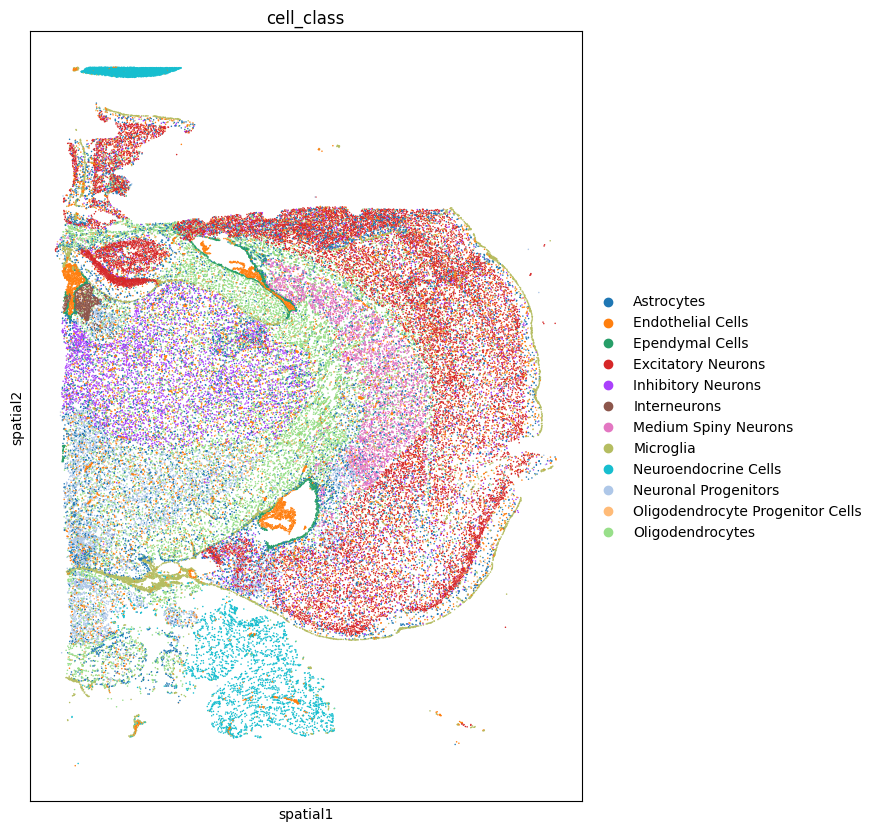

output-XETG00045__0060541__RB4676__20250917__105852


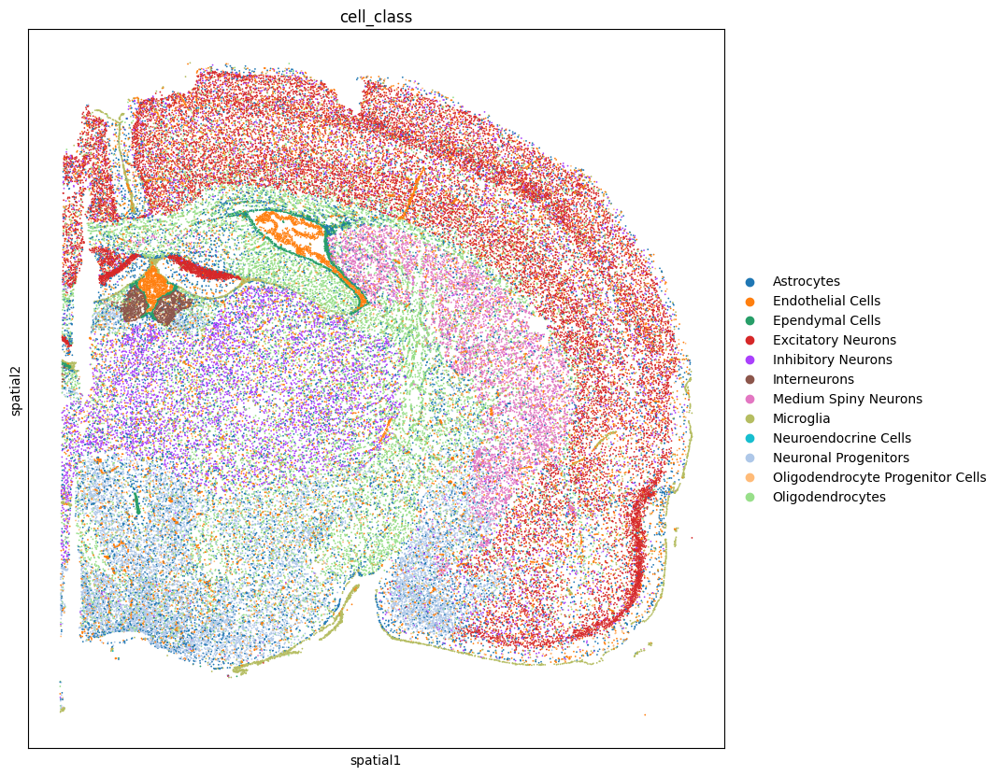

In [27]:
for run in adata.obs['run'].unique():
    print(run)
    ad_int = adata[adata.obs['run'] == run]
    with plt.rc_context({'figure.figsize': (20, 10)}):
        sc.pl.spatial(ad_int, spot_size=15, color = 'cell_class')
    plt.show()
    